# Aim


# Points

# Set up

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import FactorAnalysis

In [2]:
from ydata_profiling import ProfileReport

In [3]:
scorevar_name_self = ["self_tolerance_score", "self_pleasantness_score",
                      "self_responsibility_score", "self_carefulness_score",
                      "self_activeness_score", "self_sociability_score"]
scorevar_name_target = ["target_tolerance_score", "target_pleasantness_score",
                        "target_responsibility_score", "target_carefulness_score",
                        "target_activeness_score", "target_sociability_score"]
scorevar_name = scorevar_name_self + scorevar_name_target

In [4]:
textvar_name_self = ['self_tolerance_text', 'self_pleasantness_text',
                     'self_responsibility_text', 'self_carefulness_text',
                     'self_activeness_text', 'self_sociability_text']
textvar_name_target = ['target_tolerance_text', 'target_pleasantness_text',
                       'target_responsibility_text', 'target_carefulness_text',
                       'target_activeness_text', 'target_sociability_text']
textvar_name = textvar_name_self + textvar_name_target

# Load data

In [5]:
# Load the raw data
df = pd.read_excel('../../RawData/RawData_240216to240220.xlsx', sheet_name=1, header=0, index_col=0)
df.head()

,START,END,TIME,F1,F2t1,F3,SC1,Q1,Q2,Q3,...,Q22,Q23t1,Q24,Q25t1,Q26,Q27t1,Q28,Q29t1,STA,GATE
MID,,,,,,,,,,,,,,,,,,,,,
1.0,2024/02/16-12:21:41,2024/02/16-12:23:24,0:01:43,2.0,32.0,41.0,1.0,4.0,3.0,2.0,...,4.0,なし,4.0,なし,4.0,なし,3.0,なし,COMP,4.0
2.0,2024/02/16-12:21:18,2024/02/16-12:24:31,0:03:13,1.0,45.0,28.0,1.0,5.0,3.0,2.0,...,1.0,回答なし,4.0,回答なし,7.0,回答なし,6.0,回答なし,COMP,5.0
3.0,2024/02/16-12:22:51,2024/02/16-12:24:44,0:01:53,1.0,41.0,27.0,1.0,2.0,3.0,2.0,...,3.0,回答なし,3.0,回答なし,3.0,回答なし,3.0,回答なし,COMP,2.0
4.0,2024/02/16-12:22:23,2024/02/16-12:25:25,0:03:02,1.0,25.0,13.0,1.0,4.0,3.0,2.0,...,1.0,回答なし,7.0,回答なし,2.0,回答なし,7.0,回答なし,COMP,4.0
5.0,2024/02/16-12:23:21,2024/02/16-12:25:38,0:02:17,1.0,36.0,28.0,1.0,2.0,4.0,2.0,...,6.0,見かけただけだから,2.0,見てても文句言われない,5.0,見るのは許してくれる,3.0,あんまり反応がない,COMP,9.0


In [6]:
# Rename variables
var_df = pd.read_excel('../../Materials/variables.xlsx', sheet_name=1, header=0, index_col=None)
var_dict = dict(zip(var_df['name1'], var_df['name2']))
df = df.rename(columns=var_dict)
df.head()

,start,end,rt,self_sex,self_age,residence,participation,IOS_score,target_likedislike,target_sex,...,target_responsibility_score,target_responsibility_text,target_carefulness_score,target_carefulness_text,target_activeness_score,target_activeness_text,target_sociability_score,target_sociability_text,completion,stratumID
MID,,,,,,,,,,,,,,,,,,,,,
1.0,2024/02/16-12:21:41,2024/02/16-12:23:24,0:01:43,2.0,32.0,41.0,1.0,4.0,3.0,2.0,...,4.0,なし,4.0,なし,4.0,なし,3.0,なし,COMP,4.0
2.0,2024/02/16-12:21:18,2024/02/16-12:24:31,0:03:13,1.0,45.0,28.0,1.0,5.0,3.0,2.0,...,1.0,回答なし,4.0,回答なし,7.0,回答なし,6.0,回答なし,COMP,5.0
3.0,2024/02/16-12:22:51,2024/02/16-12:24:44,0:01:53,1.0,41.0,27.0,1.0,2.0,3.0,2.0,...,3.0,回答なし,3.0,回答なし,3.0,回答なし,3.0,回答なし,COMP,2.0
4.0,2024/02/16-12:22:23,2024/02/16-12:25:25,0:03:02,1.0,25.0,13.0,1.0,4.0,3.0,2.0,...,1.0,回答なし,7.0,回答なし,2.0,回答なし,7.0,回答なし,COMP,4.0
5.0,2024/02/16-12:23:21,2024/02/16-12:25:38,0:02:17,1.0,36.0,28.0,1.0,2.0,4.0,2.0,...,6.0,見かけただけだから,2.0,見てても文句言われない,5.0,見るのは許してくれる,3.0,あんまり反応がない,COMP,9.0


In [7]:
# check variables
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 929 entries, 1.0 to nan
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   start                        924 non-null    object 
 1   end                          924 non-null    object 
 2   rt                           924 non-null    object 
 3   self_sex                     928 non-null    float64
 4   self_age                     926 non-null    float64
 5   residence                    924 non-null    float64
 6   participation                924 non-null    float64
 7   IOS_score                    924 non-null    float64
 8   target_likedislike           924 non-null    float64
 9   target_sex                   924 non-null    float64
 10  target_age                   924 non-null    float64
 11  relationship                 924 non-null    object 
 12  self_tolerance_score         924 non-null    float64
 13  self_tolerance_text    

# Time to complete the questionnaire

In [8]:
# Convert Datatimeindex to a numeric format
rt = pd.to_datetime(df.end) - pd.to_datetime(df.start)
df['rt'] = pd.to_timedelta(rt).dt.total_seconds()

In [9]:
df['rt'].describe()

count       924.000000
mean       1762.238095
std       14187.908909
min          62.000000
25%         151.000000
50%         215.000000
75%         381.000000
max      257083.000000
Name: rt, dtype: float64

<Axes: >

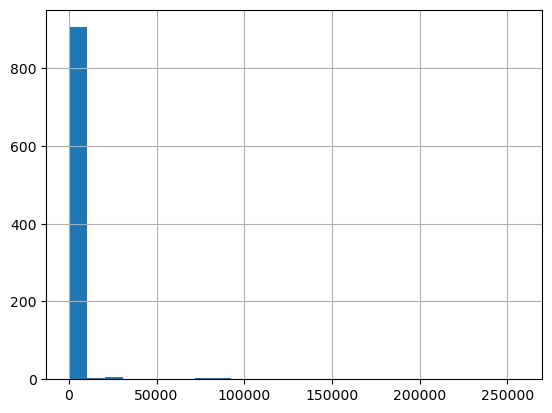

In [10]:
df['rt'].hist(bins=25)

In [11]:
# the lowest RTs
df.sort_values('rt').head(10)

,start,end,rt,self_sex,self_age,residence,participation,IOS_score,target_likedislike,target_sex,...,target_responsibility_score,target_responsibility_text,target_carefulness_score,target_carefulness_text,target_activeness_score,target_activeness_text,target_sociability_score,target_sociability_text,completion,stratumID
MID,,,,,,,,,,,,,,,,,,,,,
715.0,2024/02/16-16:41:17,2024/02/16-16:42:19,62.0,2.0,32.0,13.0,1.0,5.0,6.0,2.0,...,4.0,なし,4.0,なし,4.0,なし,4.0,なし,COMP,12.0
558.0,2024/02/16-13:09:52,2024/02/16-13:10:56,64.0,1.0,31.0,23.0,1.0,4.0,4.0,1.0,...,1.0,ない,1.0,ない,1.0,あに,1.0,ない,COMP,11.0
750.0,2024/02/16-18:27:22,2024/02/16-18:28:29,67.0,2.0,37.0,24.0,1.0,3.0,5.0,2.0,...,5.0,なし,4.0,なし,4.0,なし,3.0,なし,COMP,10.0
819.0,2024/02/16-22:54:25,2024/02/16-22:55:32,67.0,1.0,32.0,40.0,1.0,3.0,4.0,1.0,...,5.0,なし,6.0,なし,5.0,なし,4.0,なし,COMP,10.0
148.0,2024/02/16-12:33:10,2024/02/16-12:34:19,69.0,1.0,45.0,14.0,1.0,1.0,4.0,4.0,...,4.0,なし,4.0,なし,4.0,なし,4.0,なし,COMP,8.0
350.0,2024/02/16-12:51:00,2024/02/16-12:52:10,70.0,2.0,35.0,23.0,1.0,3.0,4.0,2.0,...,4.0,なし,4.0,なし,4.0,なし,4.0,なし,COMP,10.0
880.0,2024/02/19-11:11:49,2024/02/19-11:13:01,72.0,2.0,49.0,27.0,1.0,6.0,6.0,4.0,...,5.0,ない,4.0,ない,4.0,ない,3.0,ない,COMP,13.0
159.0,2024/02/16-12:33:54,2024/02/16-12:35:07,73.0,1.0,34.0,12.0,1.0,4.0,2.0,1.0,...,3.0,なし,4.0,なし,3.0,なし,3.0,なし,COMP,4.0
450.0,2024/02/16-12:58:41,2024/02/16-12:59:55,74.0,1.0,52.0,23.0,1.0,5.0,4.0,1.0,...,4.0,なし,4.0,なし,4.0,なし,4.0,なし,COMP,12.0


In [12]:
# the longest RTs
df.sort_values('rt', ascending=False).head(10)

,start,end,rt,self_sex,self_age,residence,participation,IOS_score,target_likedislike,target_sex,...,target_responsibility_score,target_responsibility_text,target_carefulness_score,target_carefulness_text,target_activeness_score,target_activeness_text,target_sociability_score,target_sociability_text,completion,stratumID
MID,,,,,,,,,,,,,,,,,,,,,
912.0,2024/02/16-18:15:37,2024/02/19-17:40:20,257083.0,1.0,51.0,14.0,1.0,3.0,4.0,2.0,...,4.0,ない,3.0,ない,4.0,ない,4.0,ない,COMP,10.0
868.0,2024/02/16-15:52:02,2024/02/19-07:07:08,227706.0,1.0,41.0,14.0,1.0,5.0,5.0,1.0,...,5.0,なし,5.0,なし,5.0,回答なし,5.0,なし,COMP,12.0
863.0,2024/02/16-15:30:55,2024/02/18-19:24:48,186833.0,2.0,55.0,13.0,1.0,4.0,4.0,4.0,...,4.0,なさ,4.0,なし,4.0,なし,4.0,なし,COMP,11.0
854.0,2024/02/17-05:42:22,2024/02/18-06:28:34,89172.0,2.0,51.0,12.0,1.0,7.0,6.0,2.0,...,7.0,特になし,4.0,わからないから,4.0,わからないから,4.0,気にしたことがないから,COMP,14.0
839.0,2024/02/16-14:39:22,2024/02/17-13:59:37,84015.0,1.0,45.0,26.0,1.0,4.0,4.0,2.0,...,1.0,なし,6.0,なし,4.0,なし,4.0,なし,COMP,11.0
831.0,2024/02/16-12:37:16,2024/02/17-10:43:56,79600.0,1.0,42.0,12.0,1.0,5.0,4.0,2.0,...,5.0,回答なし,5.0,回答なし,5.0,回答なし,5.0,回答なし,COMP,12.0
829.0,2024/02/16-12:46:01,2024/02/17-08:48:27,72146.0,1.0,58.0,22.0,1.0,5.0,2.0,1.0,...,3.0,回答ない,5.0,回答ない,5.0,回答なし,5.0,回答ない,COMP,5.0
830.0,2024/02/16-19:12:03,2024/02/17-10:36:58,55495.0,2.0,44.0,28.0,1.0,6.0,4.0,3.0,...,1.0,頼れる,4.0,分からない,1.0,探究心がある,7.0,誰とでもすぐに仲良くなる,COMP,13.0
917.0,2024/02/19-11:15:57,2024/02/19-20:07:03,31866.0,1.0,57.0,27.0,1.0,5.0,5.0,1.0,...,4.0,どちらとも言えない。,5.0,いつも慎重に行動する。,4.0,どちらでも無い。,6.0,回答なし,COMP,12.0


# Psychometrics before data exclusion

## IOS scale

In [13]:
df.groupby('IOS_score').size()

IOS_score
1.0    132
2.0    132
3.0    132
4.0    132
5.0    132
6.0    132
7.0    132
dtype: int64

## Trait adjective scores (self)

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_conte

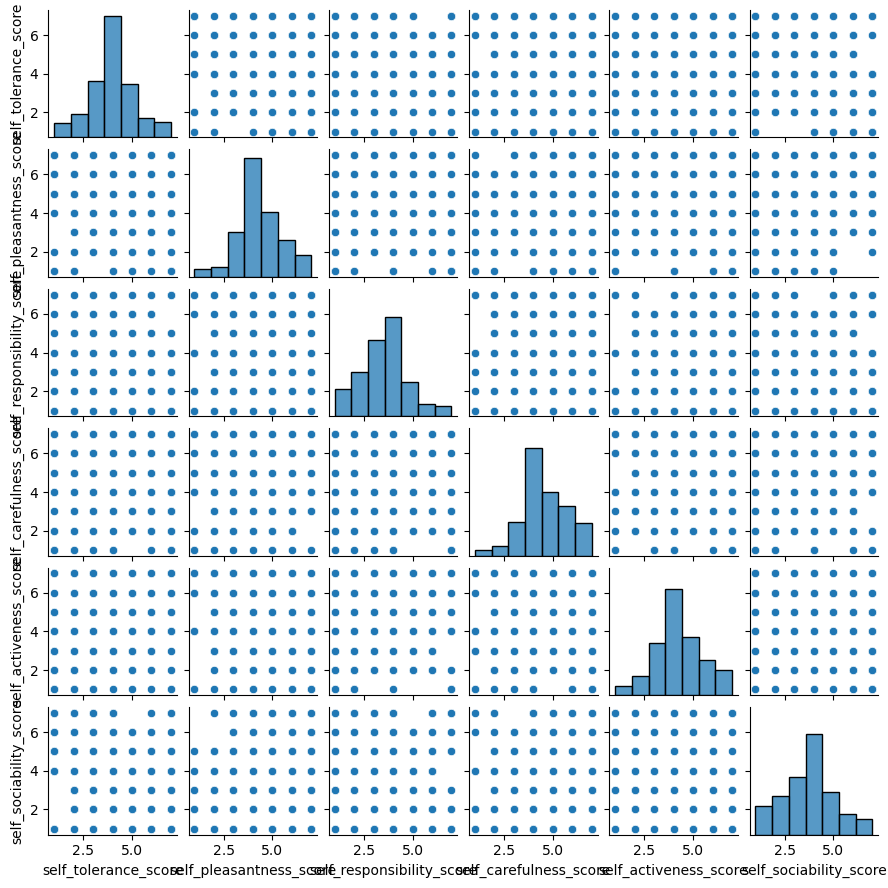

In [14]:
sns.pairplot(df[scorevar_name_self], height=1.5, diag_kind='hist', diag_kws={'bins':7})
plt.show()

<Axes: >

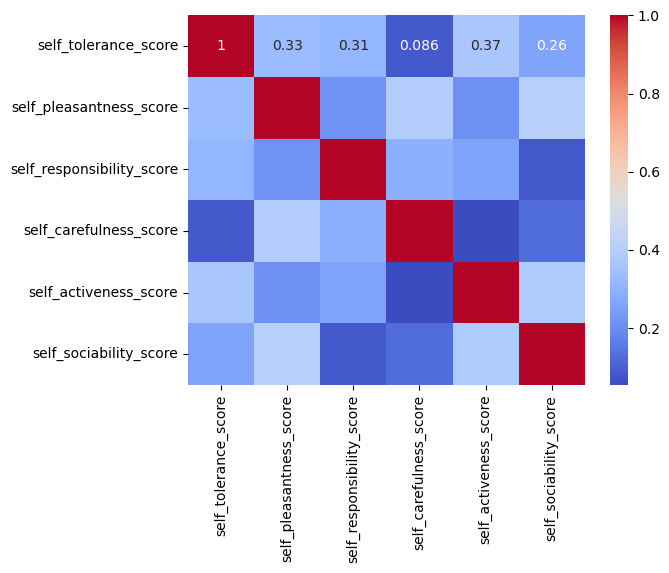

In [15]:
corr_self = df[scorevar_name_self].corr()
sns.heatmap(corr_self.abs(), annot=True, cmap='coolwarm')

## Trait adjcetive scores (target)

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

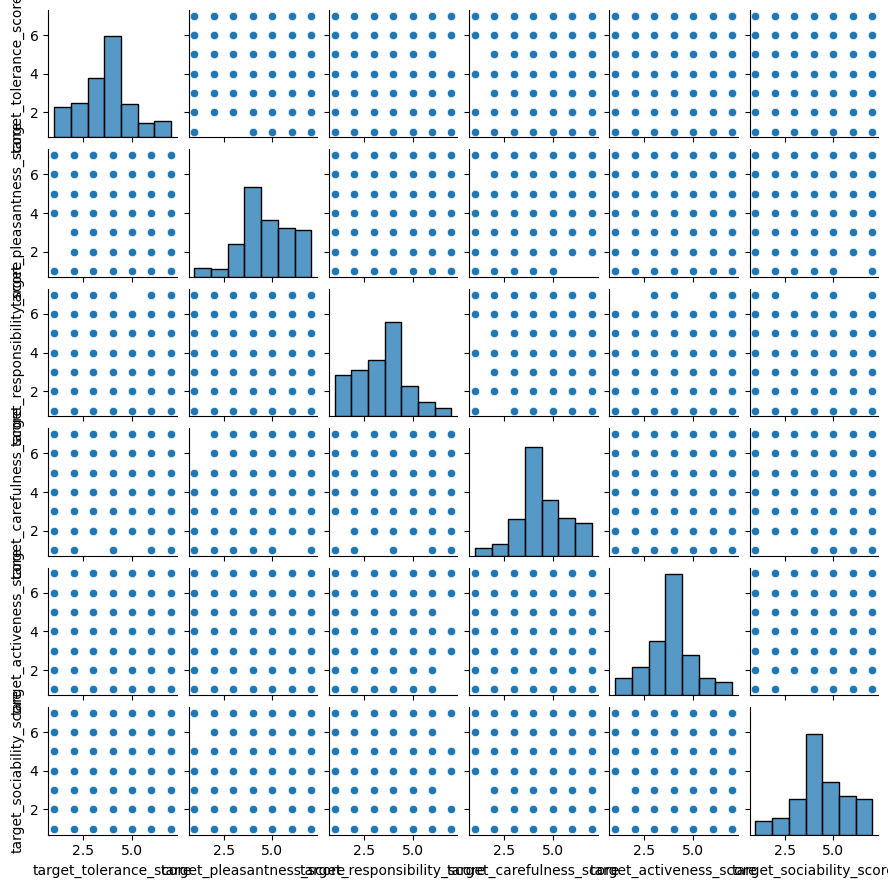

In [16]:
sns.pairplot(df[scorevar_name_target], height=1.5, diag_kind='hist', diag_kws={'bins':7})
plt.show()

<Axes: >

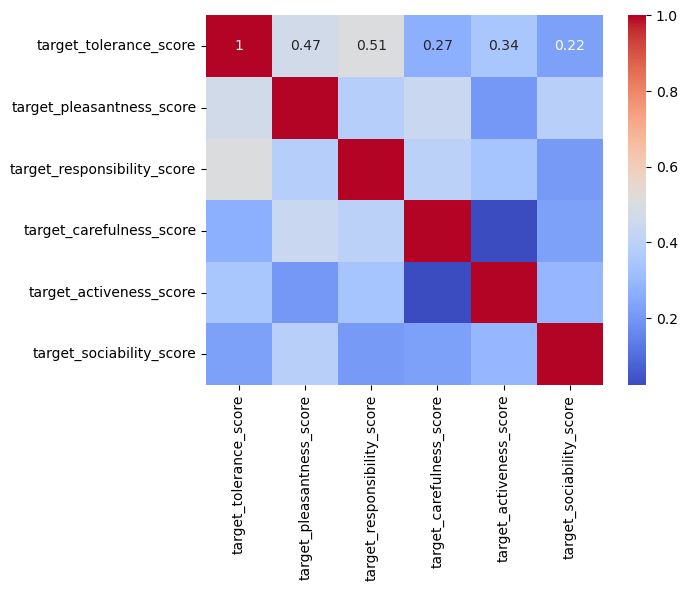

In [17]:
corr_target = df[scorevar_name_target].corr() # correlation matrix
sns.heatmap(corr_target.abs(), annot=True, cmap='coolwarm')

## Trait adjective scores (self + target)

In [18]:
df[scorevar_name].head()

,self_tolerance_score,self_pleasantness_score,self_responsibility_score,self_carefulness_score,self_activeness_score,self_sociability_score,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score
MID,,,,,,,,,,,,
1.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0
2.0,3.0,4.0,3.0,4.0,5.0,2.0,6.0,5.0,1.0,4.0,7.0,6.0
3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0
4.0,1.0,7.0,1.0,7.0,3.0,4.0,1.0,6.0,1.0,7.0,2.0,7.0
5.0,3.0,4.0,5.0,3.0,4.0,2.0,5.0,3.0,6.0,2.0,5.0,3.0


/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_conte

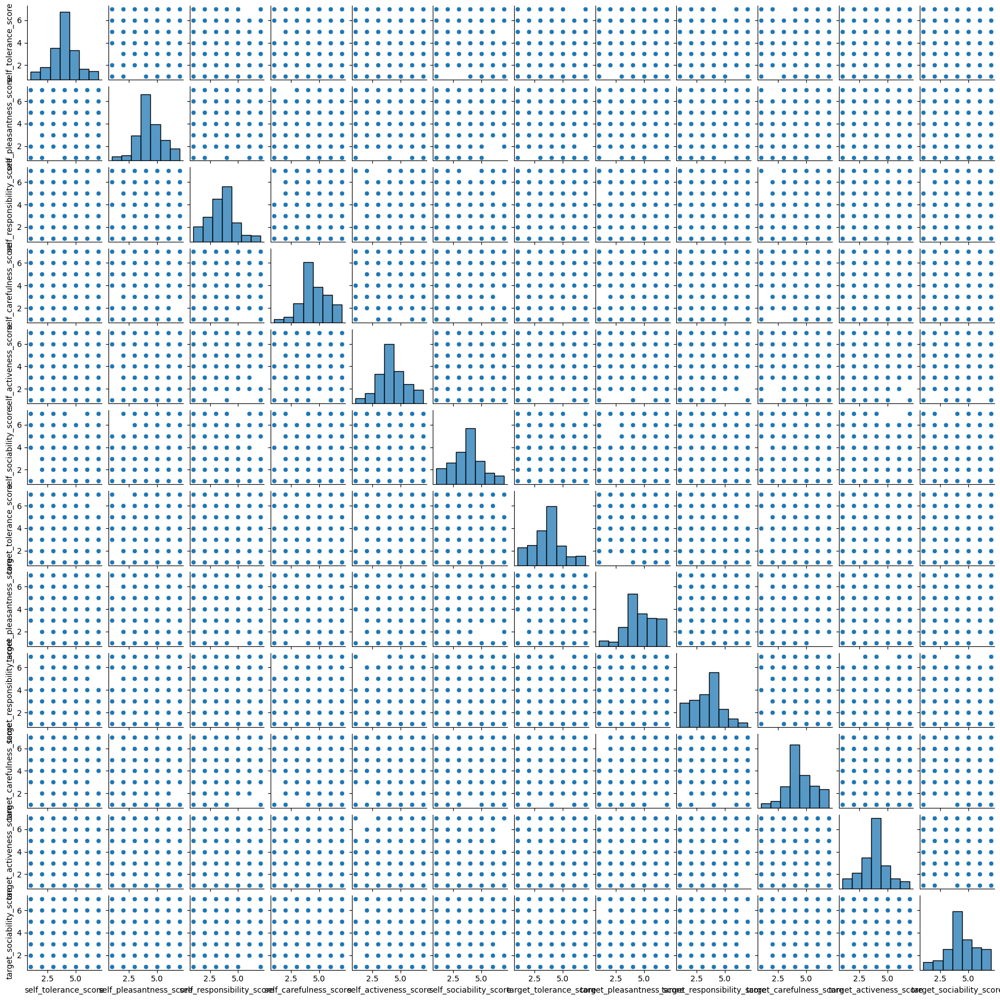

In [19]:
sns.pairplot(df[scorevar_name], height=1.5, diag_kind='hist', diag_kws={'bins':7})
plt.show()

In [20]:
corr_trait = df[scorevar_name].corr() # correlation matrix
corr_trait.head()

,self_tolerance_score,self_pleasantness_score,self_responsibility_score,self_carefulness_score,self_activeness_score,self_sociability_score,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score
self_tolerance_score,1.000000,-0.330124,0.311135,-0.086474,0.368510,-0.260243,0.202479,-0.117887,0.204571,-0.068266,0.166342,-0.022477
self_pleasantness_score,-0.330124,1.000000,-0.213780,0.391164,-0.209007,0.407906,-0.107778,0.353684,-0.153008,0.264220,0.004491,0.146960
self_responsibility_score,0.311135,-0.213780,1.000000,-0.292981,0.256788,-0.080872,0.222083,-0.124345,0.322826,-0.085005,0.205282,-0.091657
self_carefulness_score,-0.086474,0.391164,-0.292981,1.000000,0.054062,0.126566,-0.078168,0.303926,-0.106738,0.177161,-0.091990,0.199913
self_activeness_score,0.368510,-0.209007,0.256788,0.054062,1.000000,-0.383387,0.188641,-0.048359,0.159352,-0.050740,0.174660,-0.012084


<Axes: >

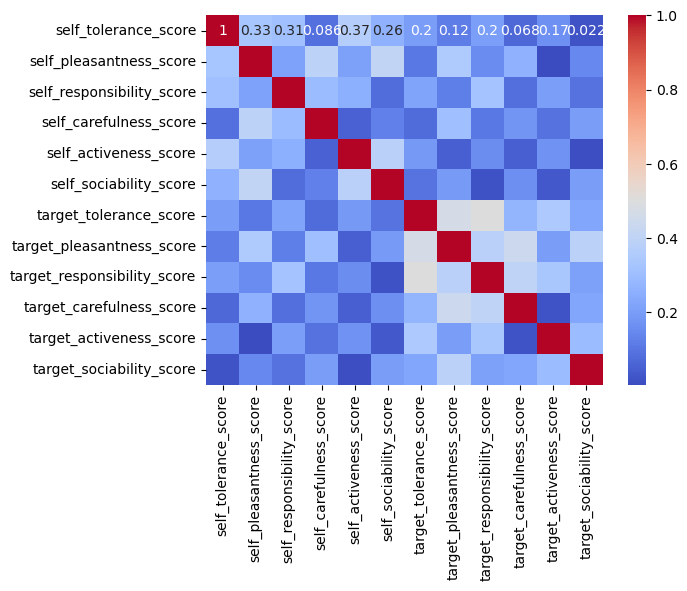

In [21]:
sns.heatmap(corr_trait.abs(), annot=True, cmap='coolwarm')

# Data Exclusion
We expected that the most frequent responses are meaningless, e.g., "回答なし" or "わからない". So, we tried to excluded those responses based on their apperance frequency.
- step1: Examines the most frequent responses
- step2: Replaces the frequent responses with a whitespace
- step3: Excludes participants whose responses are all whitespaces

## Step1: Examines the most frequent responses

In [22]:
s_concat = pd.Series(dtype=object)
for col in textvar_name:
	s_concat = pd.concat([s_concat, df.loc[:, col]], ignore_index=True)

In [23]:
s_concat.info()

<class 'pandas.core.series.Series'>
RangeIndex: 11148 entries, 0 to 11147
Series name: None
Non-Null Count  Dtype 
--------------  ----- 
11088 non-null  object
dtypes: object(1)
memory usage: 87.2+ KB


In [24]:
s_concat

0                 なし
1               回答なし
2               回答なし
3               回答なし
4        見てても文句言われない
            ...     
11143            NaN
11144            NaN
11145            NaN
11146            NaN
11147            NaN
Length: 11148, dtype: object

In [25]:
s_concat.value_counts().head(30)

回答なし          4698
なし            1608
ない             418
特になし           255
回答無し           139
特にない            90
わからない           63
普通              60
なんとなく           45
特に              27
特に無し            24
無し              21
回答無             20
回答ない            18
とくになし           18
とくにありません        17
nai             15
特にありません         13
回答ﾅｼ            12
特にございません        12
どちらともいえない       12
良い感じ            12
no              12
回答なし。           11
特にはありません        11
特にない、わからない      11
特にありません。        11
どちらとも言えない       10
ありません           10
まあまあ            10
Name: count, dtype: int64

In [26]:
rep_list = list(s_concat.value_counts()[0:20].index) # Top 20 frequent responses
print(rep_list)

['回答なし', 'なし', 'ない', '特になし', '回答無し', '特にない', 'わからない', '普通', 'なんとなく', '特に', '特に無し', '無し', '回答無', '回答ない', 'とくになし', 'とくにありません', 'nai', '特にありません', '回答ﾅｼ', '特にございません']


## Steps 2 and 3: Replaces the responses and excludes the records

In [27]:
len(df)

929

In [28]:
df2 = df.replace(rep_list, '').drop_duplicates(subset=textvar_name, keep=False)

In [29]:
len(df2)

479

## Check the remaining records

In [30]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 479 entries, 2.0 to 924.0
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   start                        479 non-null    object 
 1   end                          479 non-null    object 
 2   rt                           479 non-null    float64
 3   self_sex                     479 non-null    float64
 4   self_age                     479 non-null    float64
 5   residence                    479 non-null    float64
 6   participation                479 non-null    float64
 7   IOS_score                    479 non-null    float64
 8   target_likedislike           479 non-null    float64
 9   target_sex                   479 non-null    float64
 10  target_age                   479 non-null    float64
 11  relationship                 479 non-null    object 
 12  self_tolerance_score         479 non-null    float64
 13  self_tolerance_text  

In [31]:
df2.loc[:, textvar_name].head(10)

,self_tolerance_text,self_pleasantness_text,self_responsibility_text,self_carefulness_text,self_activeness_text,self_sociability_text,target_tolerance_text,target_pleasantness_text,target_responsibility_text,target_carefulness_text,target_activeness_text,target_sociability_text
MID,,,,,,,,,,,,
2.0,,,,,,回答梨,,,,,,
5.0,見てても文句言われない,,,,,,,愛想が悪い,見かけただけだから,見てても文句言われない,見るのは許してくれる,あんまり反応がない
7.0,直ぐに許してしまう,人に道を聞かれる,休暇中でも仕事のことが気になる,たまに物を落とす,慎重に物事を進める,飲み会が嫌い,怒っても直ぐに許してくれる,優しい,真面目で勤勉,確りしている,大人しい,インドアが好き
8.0,,,,かし,,,,,,,ふつう,
11.0,普通の人です,,いったことは守ります,,,社交的ではないが他者を排除しない,,,,,,
13.0,,,,,,,,,まあまあ,いろいろ,,
24.0,広くはない,,,軽率でない,消極的,,人に厳しい,,,慎重,口だけ,
27.0,自分のことばかりだから,他人に対して不愛想だから,逃げることばかり考えているから,常に二の足を踏むから,何も動こうとしないから,人と触れ合うと疲れるため,自分とも話をしてくれるから,自分に合わせてくれるから,そこまでの付き合いがないから,詳しく知らないから,話していると元気をもらえるから,話していて疲れないから
28.0,,知らない,,,,知らない,,,知らない,,,知らない


In [32]:
s_concat2 = pd.Series(dtype=object)
for col in textvar_name:
	s_concat2 = pd.concat([s_concat2, df2.loc[:, col]], ignore_index=True)

In [33]:
s_concat2.value_counts().head(30)

               2233
no               12
良い感じ             12
どちらともいえない        12
特にありません。         11
特にない、わからない       11
回答なし。            11
特にはありません         11
まあまあ             10
ありません            10
どちらとも言えない        10
普通だと思う            9
誰とでも仲良くなれる        9
分からない             9
何となく              9
優しい               9
回答しない             9
そう思う              9
楽しい               9
普通だから             9
人見知り              7
よくわからない           7
話が広がる             7
特にないです。           7
なさ                7
何とも言えないのである       7
かいとうなし            7
人当たりが良い           7
とくにこだわりはなく、       6
とくにない             6
Name: count, dtype: int64

In [34]:
df2.isnull().sum().sum()

0

## Completion ratio

In [35]:
print('Num. of Original Samples: ' + str(len(df)))
print('Num. of Excluded Samples: ' + str(len(df) - len(df2)))
print('Num. of Remaining Samples: ' + str(len(df2)))
print('Completion Ratio: ' + str(len(df2) / len(df)))


Num. of Original Samples: 929
Num. of Excluded Samples: 450
Num. of Remaining Samples: 479
Completion Ratio: 0.5156081808396125


# Psychometrics after data exclusion

## IOS

In [36]:
df2.groupby('IOS_score').size()

IOS_score
1.0    64
2.0    75
3.0    61
4.0    75
5.0    66
6.0    72
7.0    66
dtype: int64

## Trait adjective scores (self)

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

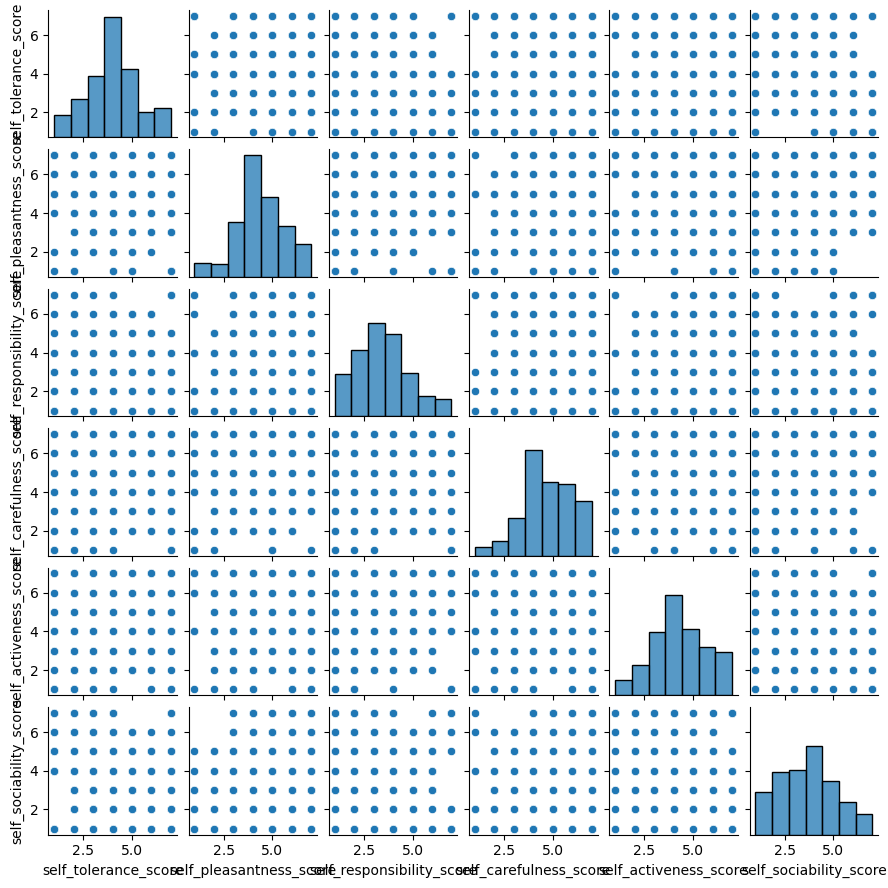

In [37]:
sns.pairplot(df2[scorevar_name_self], height=1.5, diag_kind="hist", diag_kws={'bins':7})
plt.show()

In [38]:
corr_self = df2[scorevar_name_self].corr()
corr_self.head(6)

,self_tolerance_score,self_pleasantness_score,self_responsibility_score,self_carefulness_score,self_activeness_score,self_sociability_score
self_tolerance_score,1.000000,-0.310147,0.252608,-0.083907,0.322036,-0.223719
self_pleasantness_score,-0.310147,1.000000,-0.161122,0.363467,-0.229578,0.422980
self_responsibility_score,0.252608,-0.161122,1.000000,-0.277785,0.268743,-0.058846
self_carefulness_score,-0.083907,0.363467,-0.277785,1.000000,0.061532,0.104114
self_activeness_score,0.322036,-0.229578,0.268743,0.061532,1.000000,-0.373159
self_sociability_score,-0.223719,0.422980,-0.058846,0.104114,-0.373159,1.000000


<Axes: >

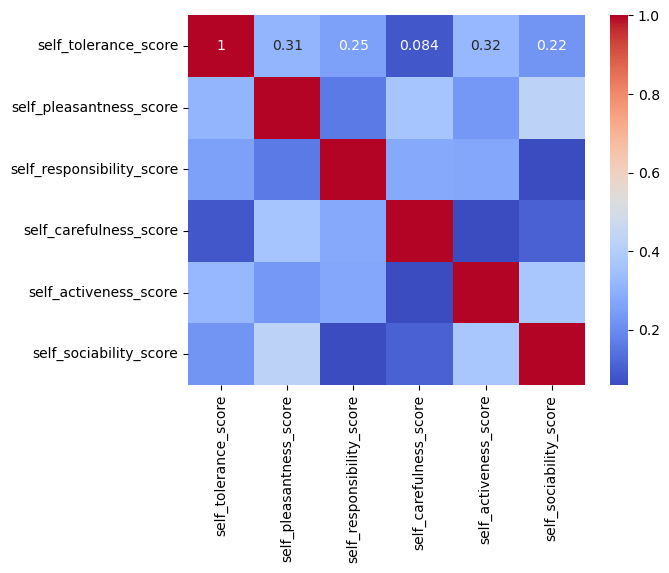

In [39]:
sns.heatmap(corr_self.abs(), annot=True, cmap='coolwarm')

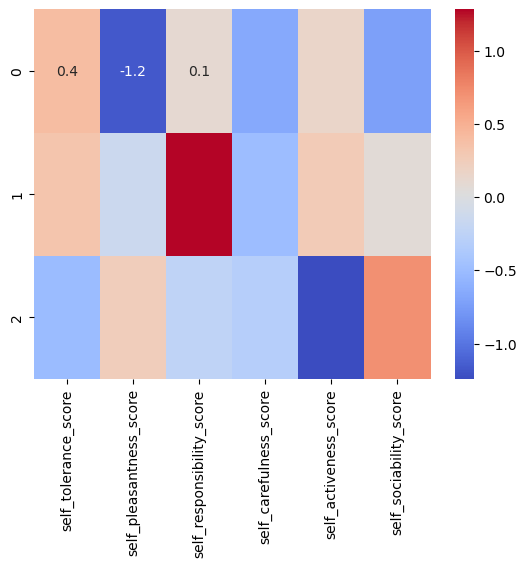

In [40]:
fa = FactorAnalysis(n_components=3, rotation='varimax')
df2_fa_self = fa.fit_transform(df2[scorevar_name_self])

df2_fa_self_loadings = pd.DataFrame(fa.components_, columns=scorevar_name_self)
sns.heatmap(df2_fa_self_loadings, annot=True, cmap='coolwarm')
plt.show()

## Trait adjective scores (target)

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

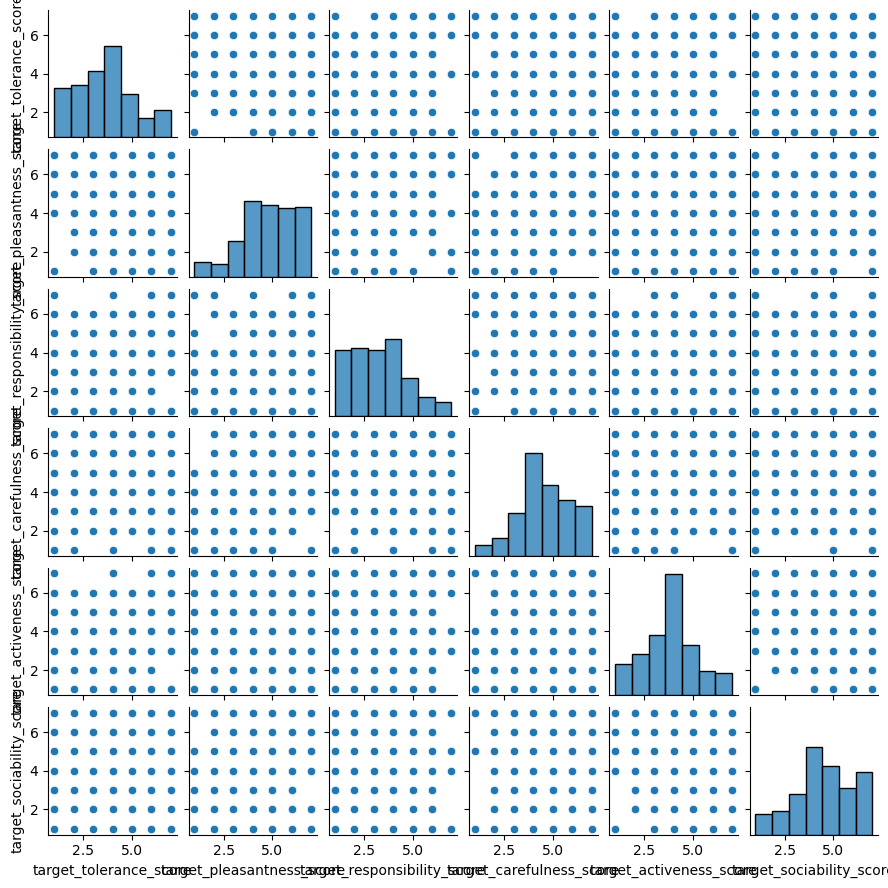

In [41]:
sns.pairplot(df2[scorevar_name_target], height=1.5, diag_kind="hist", diag_kws={'bins':7})
plt.show()

In [42]:
corr_target = df2[scorevar_name_target].corr()
corr_target.head(6)

,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score
target_tolerance_score,1.000000,-0.484050,0.515346,-0.246933,0.349801,-0.200220
target_pleasantness_score,-0.484050,1.000000,-0.354282,0.395330,-0.190985,0.356078
target_responsibility_score,0.515346,-0.354282,1.000000,-0.404819,0.328793,-0.174329
target_carefulness_score,-0.246933,0.395330,-0.404819,1.000000,0.049472,0.199522
target_activeness_score,0.349801,-0.190985,0.328793,0.049472,1.000000,-0.293480
target_sociability_score,-0.200220,0.356078,-0.174329,0.199522,-0.293480,1.000000


<Axes: >

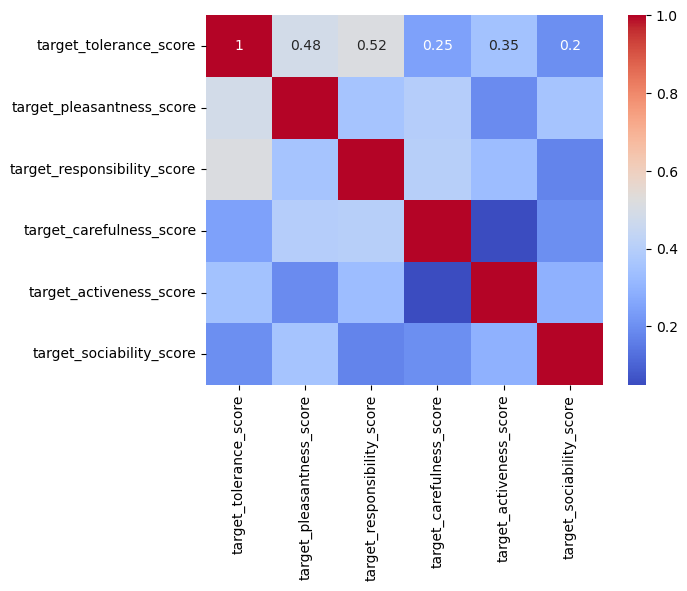

In [43]:
sns.heatmap(corr_target.abs(), annot=True, cmap='coolwarm')

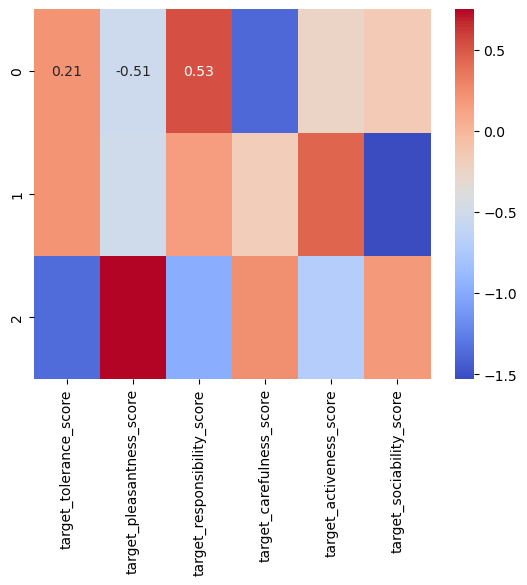

In [44]:
fa = FactorAnalysis(n_components=3, rotation='varimax')
df2_fa_target = fa.fit_transform(df2[scorevar_name_target])

df2_fa_target_loadings = pd.DataFrame(fa.components_, columns=scorevar_name_target)
sns.heatmap(df2_fa_target_loadings, annot=True, cmap='coolwarm')
plt.show()

## Trait adjective scores (self + target)

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dty

/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_conte

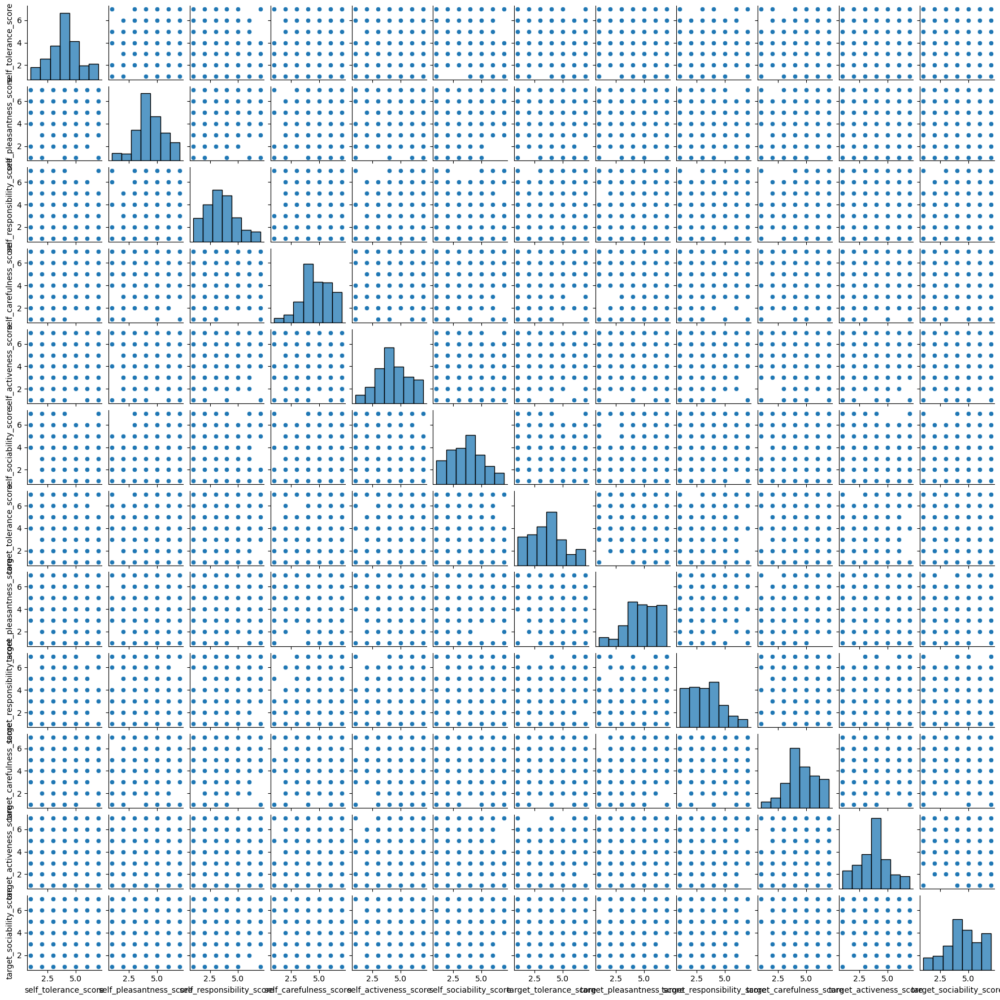

In [45]:
sns.pairplot(df2[scorevar_name], height=1.5, diag_kind="hist", diag_kws={'bins':7})
plt.show()

In [46]:
corr_both = df2[scorevar_name].corr()
corr_both.head(6)

,self_tolerance_score,self_pleasantness_score,self_responsibility_score,self_carefulness_score,self_activeness_score,self_sociability_score,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score
self_tolerance_score,1.000000,-0.310147,0.252608,-0.083907,0.322036,-0.223719,0.145588,-0.075603,0.179290,-0.028939,0.093209,0.009467
self_pleasantness_score,-0.310147,1.000000,-0.161122,0.363467,-0.229578,0.422980,-0.058567,0.331729,-0.116678,0.233866,0.055026,0.102874
self_responsibility_score,0.252608,-0.161122,1.000000,-0.277785,0.268743,-0.058846,0.190598,-0.055030,0.332624,-0.029642,0.158476,-0.047670
self_carefulness_score,-0.083907,0.363467,-0.277785,1.000000,0.061532,0.104114,-0.001992,0.252398,-0.044611,0.147158,-0.092718,0.158906
self_activeness_score,0.322036,-0.229578,0.268743,0.061532,1.000000,-0.373159,0.181809,-0.042084,0.154826,-0.013698,0.134150,-0.001685
self_sociability_score,-0.223719,0.422980,-0.058846,0.104114,-0.373159,1.000000,-0.051960,0.178685,0.048761,0.137521,0.036563,0.181909


<Axes: >

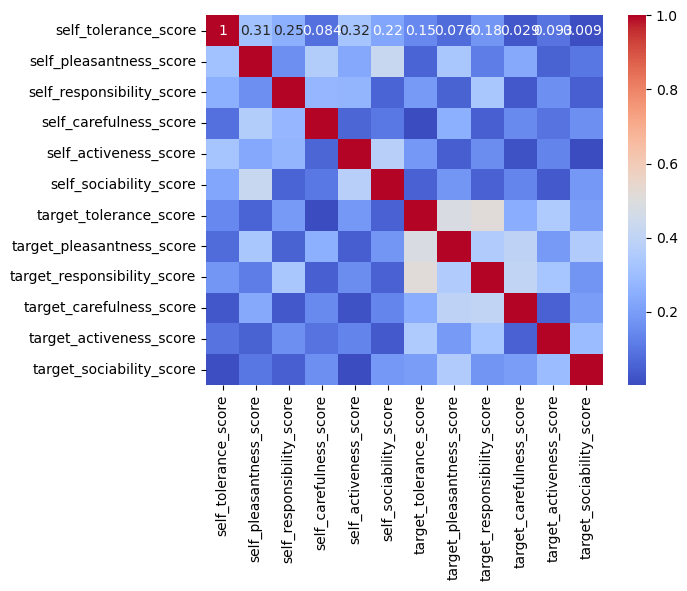

In [47]:
sns.heatmap(corr_both.abs(), annot=True, cmap='coolwarm')

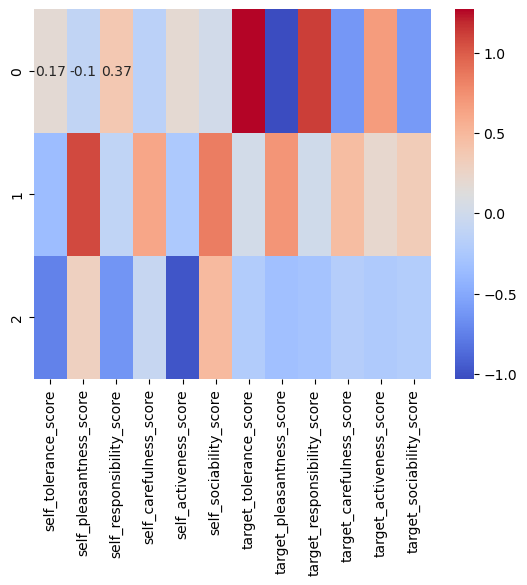

In [48]:
fa = FactorAnalysis(n_components=3, rotation='varimax')
df2_fa_both = fa.fit_transform(df2[scorevar_name])

df2_fa_both_loadings = pd.DataFrame(fa.components_, columns=scorevar_name)
sns.heatmap(df2_fa_both_loadings, annot=True, cmap='coolwarm')
plt.show()

## IOS * Trait adjective scores

In [49]:
ProfileReport(df2[["IOS_score"] + scorevar_name], title='Profile Report of the Data', explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Output
Save:
- Text data as txt
- Data Frame as xlsx

## Text Data

In [50]:
textvar_name_self

['self_tolerance_text',
 'self_pleasantness_text',
 'self_responsibility_text',
 'self_carefulness_text',
 'self_activeness_text',
 'self_sociability_text']

In [51]:
textvar_name_target

['target_tolerance_text',
 'target_pleasantness_text',
 'target_responsibility_text',
 'target_carefulness_text',
 'target_activeness_text',
 'target_sociability_text']

In [52]:
textvar_name

['self_tolerance_text',
 'self_pleasantness_text',
 'self_responsibility_text',
 'self_carefulness_text',
 'self_activeness_text',
 'self_sociability_text',
 'target_tolerance_text',
 'target_pleasantness_text',
 'target_responsibility_text',
 'target_carefulness_text',
 'target_activeness_text',
 'target_sociability_text']

In [53]:
df2.loc[:, textvar_name].head()

,self_tolerance_text,self_pleasantness_text,self_responsibility_text,self_carefulness_text,self_activeness_text,self_sociability_text,target_tolerance_text,target_pleasantness_text,target_responsibility_text,target_carefulness_text,target_activeness_text,target_sociability_text
MID,,,,,,,,,,,,
2.0,,,,,,回答梨,,,,,,
5.0,見てても文句言われない,,,,,,,愛想が悪い,見かけただけだから,見てても文句言われない,見るのは許してくれる,あんまり反応がない
7.0,直ぐに許してしまう,人に道を聞かれる,休暇中でも仕事のことが気になる,たまに物を落とす,慎重に物事を進める,飲み会が嫌い,怒っても直ぐに許してくれる,優しい,真面目で勤勉,確りしている,大人しい,インドアが好き
8.0,,,,かし,,,,,,,ふつう,
11.0,普通の人です,,いったことは守ります,,,社交的ではないが他者を排除しない,,,,,,


In [54]:
filename = './Results/output01_all.txt'
with open(filename, 'w') as f:
	df2_string = df2.loc[:, textvar_name].to_string(header=True, index=True)
	f.write(df2_string)

In [55]:
filename = './Results/output01_self.txt'
with open(filename, 'w') as f:
	df2_string = df2.loc[:, textvar_name_self].to_string(header=True, index=True)
	f.write(df2_string)

In [56]:
filename = './Results/output01_target.txt'
with open(filename, 'w') as f:
	df2_string = df2.loc[:, textvar_name_target].to_string(header=True, index=True)
	f.write(df2_string)

In [57]:
df2.drop(textvar_name, axis='columns', inplace=True)
df2.head()

,start,end,rt,self_sex,self_age,residence,participation,IOS_score,target_likedislike,target_sex,...,self_activeness_score,self_sociability_score,target_tolerance_score,target_pleasantness_score,target_responsibility_score,target_carefulness_score,target_activeness_score,target_sociability_score,completion,stratumID
MID,,,,,,,,,,,,,,,,,,,,,
2.0,2024/02/16-12:21:18,2024/02/16-12:24:31,193.0,1.0,45.0,28.0,1.0,5.0,3.0,2.0,...,5.0,2.0,6.0,5.0,1.0,4.0,7.0,6.0,COMP,5.0
5.0,2024/02/16-12:23:21,2024/02/16-12:25:38,137.0,1.0,36.0,28.0,1.0,2.0,4.0,2.0,...,4.0,2.0,5.0,3.0,6.0,2.0,5.0,3.0,COMP,9.0
7.0,2024/02/16-12:20:52,2024/02/16-12:25:45,293.0,1.0,54.0,12.0,1.0,5.0,1.0,2.0,...,5.0,3.0,1.0,7.0,1.0,6.0,6.0,2.0,COMP,5.0
8.0,2024/02/16-12:24:28,2024/02/16-12:26:11,103.0,1.0,36.0,14.0,1.0,1.0,1.0,2.0,...,3.0,3.0,1.0,7.0,1.0,5.0,4.0,7.0,COMP,1.0
11.0,2024/02/16-12:23:46,2024/02/16-12:26:26,160.0,1.0,56.0,13.0,1.0,2.0,1.0,2.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,COMP,2.0


In [58]:
df2.columns

Index(['start', 'end', 'rt', 'self_sex', 'self_age', 'residence',
       'participation', 'IOS_score', 'target_likedislike', 'target_sex',
       'target_age', 'relationship', 'self_tolerance_score',
       'self_pleasantness_score', 'self_responsibility_score',
       'self_carefulness_score', 'self_activeness_score',
       'self_sociability_score', 'target_tolerance_score',
       'target_pleasantness_score', 'target_responsibility_score',
       'target_carefulness_score', 'target_activeness_score',
       'target_sociability_score', 'completion', 'stratumID'],
      dtype='object')

In [59]:
filename = "./Results/output01_all.csv"
df2.to_csv(filename, index=True)